In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.ops import unary_union
from shapely.affinity import scale
from shapely.geometry import Point
from shapely.ops import split
from shapely.ops import linemerge
from shapely.geometry import MultiLineString
from shapely.geometry import LineString
from shapely.geometry import Polygon

In [2]:
divisions = gpd.read_file('../../preprocessing/geodata/maps/dist/div/div-c005-s020-vw-pr.geojson').to_crs(epsg=32645)
districts = gpd.read_file('../../preprocessing/geodata/maps/dist/dis/dis-c005-s020-vw-pr.geojson').to_crs(epsg=32645)
upazilas = gpd.read_file('../../preprocessing/geodata/maps/dist/upa/upa-c005-s020-vw-pr.geojson').to_crs(epsg=32645)
unions = gpd.read_file('../../preprocessing/geodata/maps/dist/uni/uni-c005-s020-vw-pr.geojson').to_crs(epsg=32645)
mouzas = gpd.read_file('../../preprocessing/geodata/maps/dist/mou/mou-c005-s020-vw-pr.geojson').to_crs(epsg=32645)

In [3]:
print('========DIV========\n')
divisions.info()
print('========DIS========\n')
districts.info()
print('========UPA========\n')
upazilas.info()
print('========UNI========\n')
unions.info()
print('========MOU========\n')
mouzas.info()

========DIV========

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 8 entries, 0 to 7
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   area      8 non-null      float64 
 1   div       8 non-null      object  
 2   geometry  8 non-null      geometry
dtypes: float64(1), geometry(1), object(1)
memory usage: 320.0+ bytes
========DIS========

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 64 entries, 0 to 63
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   area      64 non-null     float64 
 1   dis       64 non-null     object  
 2   div       64 non-null     object  
 3   geometry  64 non-null     geometry
dtypes: float64(1), geometry(1), object(2)
memory usage: 2.1+ KB
========UPA========

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 544 entries, 0 to 543
Data columns (total 5 columns):
 #   Column    Non-Null Count  D

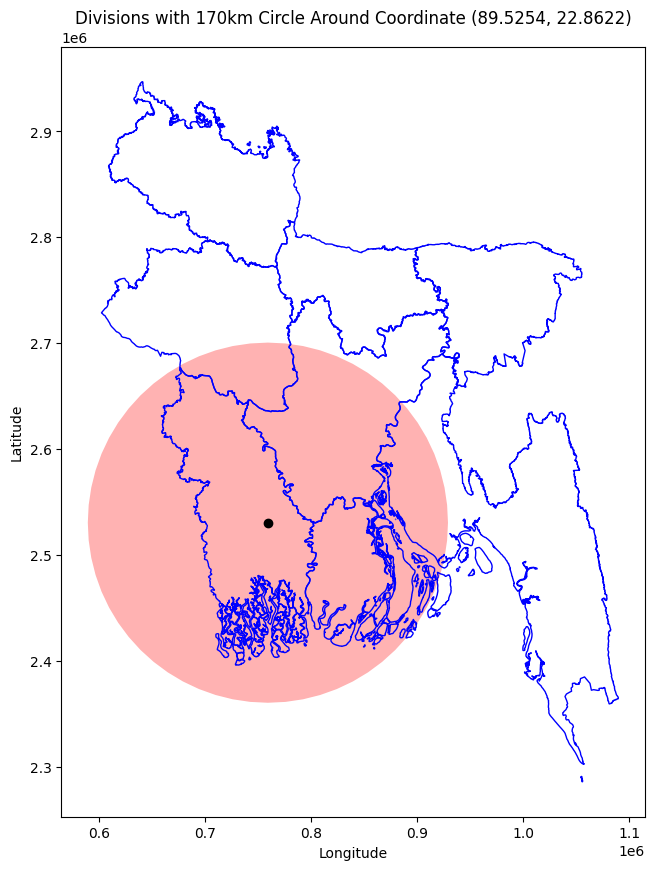

In [4]:
div_gdf = divisions.set_crs(epsg=32645, allow_override=True)

# Create the 100km radius circle around the given coordinates (in EPSG:32645)
center_point = Point(89.5254, 22.8622)  # Longitude, Latitude
center_gdf = gpd.GeoDataFrame(geometry=[center_point], crs="EPSG:4326")

# Convert the center point to EPSG:32645 (projected CRS for UTM zone 45N)
center_gdf = center_gdf.to_crs(epsg=32645)
center_point_utm = center_gdf.geometry.iloc[0]

# Create a 100km buffer (100,000 meters)
circle_buffer = center_point_utm.buffer(170000)  # Buffer in meters

# Plotting the divisions and the circle
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the division boundaries (assuming divisions are already in EPSG:32645)
div_gdf.boundary.plot(ax=ax, color='blue', linewidth=1)

# Plot the 100km circle
gpd.GeoSeries([circle_buffer]).plot(ax=ax, color='red', alpha=0.3)

# Mark the center point
gpd.GeoSeries([center_point_utm]).plot(ax=ax, color='black')

plt.title('Divisions with 170km Circle Around Coordinate (89.5254, 22.8622)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [14]:
center_point = Point(89.5254, 22.8622)

# Convert the center point to a GeoDataFrame
center_gdf = gpd.GeoDataFrame(geometry=[center_point], crs="EPSG:4326")

# Reproject the center point to EPSG:32645 (UTM zone 45N)
center_gdf = center_gdf.to_crs(epsg=32645)
center_point_utm = center_gdf.geometry.iloc[0]

# Create a 170 km (170,000 meters) buffer around the center point
buffer = center_point_utm.buffer(30000)  # 170 km in meters

# Ensure that all your GeoDataFrames are in EPSG:32645
divisions = divisions.to_crs(epsg=32645)
districts = districts.to_crs(epsg=32645)
upazilas = upazilas.to_crs(epsg=32645)
unions = unions.to_crs(epsg=32645)
mouzas = mouzas.to_crs(epsg=32645)

# Select regions entirely within the 170 km buffer
divisions_within = divisions[divisions.geometry.intersects(buffer)]
districts_within = districts[districts.geometry.intersects(buffer)]
upazilas_within = upazilas[upazilas.geometry.intersects(buffer)]
unions_within = unions[unions.geometry.intersects(buffer)]
mouzas_within = mouzas[mouzas.geometry.intersects(buffer)]

# Plot all the region dataframes
fig, ax = plt.subplots(figsize=(30, 30), dpi=300)

# Plotting the 170 km buffer
gpd.GeoSeries([buffer]).plot(ax=ax, color='none', edgecolor='red', linewidth=2, label='170km Buffer')

# Plot divisions within the buffer
# divisions_within.boundary.plot(ax=ax, color='black', linewidth=1.3, label='Divisions')

# Plot districts within the buffer
# districts_within.boundary.plot(ax=ax, color='green', linewidth=1, label='Districts')

# # Plot upazilas within the buffer
# upazilas_within.boundary.plot(ax=ax, color='orange', linewidth=0.7, label='Upazilas')

# Plot unions within the buffer
unions_within.boundary.plot(ax=ax, color='blue', linewidth=0.5, label='Unions')

# Plot mouzas within the buffer
mouzas_within.boundary.plot(ax=ax, color='purple', linewidth=1, label='Mouzas')

# Final plot adjustments
plt.title('Regions within 170 km Buffer Around Coordinate (89.5254, 22.8622)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()

# Print information about the selected regions
print('========DIV========\n')
divisions_within.info()
print('========DIS========\n')
districts_within.info()
print('========UPA========\n')
upazilas_within.info()
print('========UNI========\n')
unions_within.info()
print('========MOU========\n')
mouzas_within.info()


/tmp/ipykernel_1245395/155238540.py:52: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


========DIV========

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 2 entries, 1 to 5
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   area      2 non-null      float64 
 1   div       2 non-null      object  
 2   geometry  2 non-null      geometry
dtypes: float64(1), geometry(1), object(1)
memory usage: 64.0+ bytes
========DIS========

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 6 entries, 9 to 50
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   area      6 non-null      float64 
 1   dis       6 non-null      object  
 2   div       6 non-null      object  
 3   geometry  6 non-null      geometry
dtypes: float64(1), geometry(1), object(2)
memory usage: 240.0+ bytes
========UPA========

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 27 entries, 40 to 510
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype   
--- 

In [15]:
def intersect_geometries_within_hierarchy(upper_gdf, lower_gdf):
    """
    For each geometry in the upper level GeoDataFrame (e.g., division), get all geometries
    from the lower level GeoDataFrame (e.g., district) that are entirely or partially within it.
    Then, perform a spatial intersection to get the portions of lower-level geometries that
    intersect with the upper-level boundaries.
    
    Parameters:
    - upper_gdf: GeoDataFrame of the higher-level regions (e.g., divisions).
    - lower_gdf: GeoDataFrame of the lower-level regions (e.g., districts).
    
    Returns:
    - A GeoDataFrame of intersected lower-level geometries.
    """
    intersected_geometries = []
    
    # Iterate over each upper-level geometry (e.g., division)
    for upper_row in upper_gdf.itertuples():
        upper_geom = upper_row.geometry
        
        # Find lower-level geometries (e.g., districts) that intersect the upper geometry
        lower_geoms_within = lower_gdf[lower_gdf.geometry.intersects(upper_geom)]
        
        # Iterate over the lower-level geometries (e.g., districts)
        for lower_row in lower_geoms_within.itertuples():
            lower_geom = lower_row.geometry
            
            if upper_geom.intersects(lower_geom):
                # Perform intersection and keep only the part that falls within the upper-level boundary
                intersection = lower_geom.intersection(upper_geom)
                
                if not intersection.is_empty:
                    # Append the resulting intersection geometry to the list
                    intersected_geometries.append({
                        'geometry': intersection,
                        'upper_region': upper_row.Index,
                        'lower_region': lower_row.Index
                    })
    
    # Create a new GeoDataFrame for the intersected geometries
    intersected_gdf = gpd.GeoDataFrame(intersected_geometries)
    
    return intersected_gdf

split_districts = intersect_geometries_within_hierarchy(divisions_within, districts_within)
split_upazilas = intersect_geometries_within_hierarchy(districts_within, upazilas_within)
split_unions = intersect_geometries_within_hierarchy(upazilas_within, unions_within)
split_mouzas = intersect_geometries_within_hierarchy(unions_within, mouzas_within)

def filter_polygons(gdf):
    """Filter GeoDataFrame to include only polygons or multipolygons."""
    return gdf[gdf.geometry.type.isin(['Polygon', 'MultiPolygon'])]

# Ensure we only plot valid polygons for each layer
split_districts = filter_polygons(split_districts)
split_upazilas = filter_polygons(split_upazilas)
split_unions = filter_polygons(split_unions)
split_mouzas = filter_polygons(split_mouzas)

# Plot all the region dataframes
fig, ax = plt.subplots(figsize=(30, 30), dpi=300)

# Plot divisions within the buffer
# split_districts.boundary.plot(ax=ax, color='green', linewidth=1.3, label='Districts')

# # Plot districts within the buffer
# split_upazilas.boundary.plot(ax=ax, color='orange', linewidth=1, label='Upazilas')

# Plot upazilas within the buffer
split_unions.boundary.plot(ax=ax, color='blue', linewidth=0.5, label='Unions')

# Plot unions within the buffer
split_mouzas.boundary.plot(ax=ax, color='purple', linewidth=1, label='Mouzas')

# Final plot adjustments
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()

split_districts.info()
split_upazilas.info()
split_unions.info()
split_mouzas.info()


<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 6 entries, 1 to 6
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   geometry      6 non-null      geometry
 1   upper_region  6 non-null      int64   
 2   lower_region  6 non-null      int64   
dtypes: geometry(1), int64(2)
memory usage: 192.0 bytes
<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 27 entries, 1 to 60
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   geometry      27 non-null     geometry
 1   upper_region  27 non-null     int64   
 2   lower_region  27 non-null     int64   
dtypes: geometry(1), int64(2)
memory usage: 864.0 bytes
<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 169 entries, 0 to 431
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   geometry      169 non-null    geometry
 